In [3]:
import pandas as pd


In [5]:
import pandas as pd

df = pd.read_excel('/data.xlsx')
print(df.head())
print(df.shape)
print(df.describe())


  Unnamed: 0      ID   Salary        DOJ                  DOL  \
0      train  203097   420000 2012-06-01              present   
1      train  579905   500000 2013-09-01              present   
2      train  810601   325000 2014-06-01              present   
3      train  267447  1100000 2011-07-01              present   
4      train  343523   200000 2014-03-01  2015-03-01 00:00:00   

                Designation    JobCity Gender        DOB  10percentage  ...  \
0   senior quality engineer  Bangalore      f 1990-02-19          84.3  ...   
1         assistant manager     Indore      m 1989-10-04          85.4  ...   
2          systems engineer    Chennai      f 1992-08-03          85.0  ...   
3  senior software engineer    Gurgaon      m 1989-12-05          85.6  ...   
4                       get    Manesar      m 1991-02-27          78.0  ...   

  ComputerScience  MechanicalEngg  ElectricalEngg TelecomEngg  CivilEngg  \
0              -1              -1              -1         

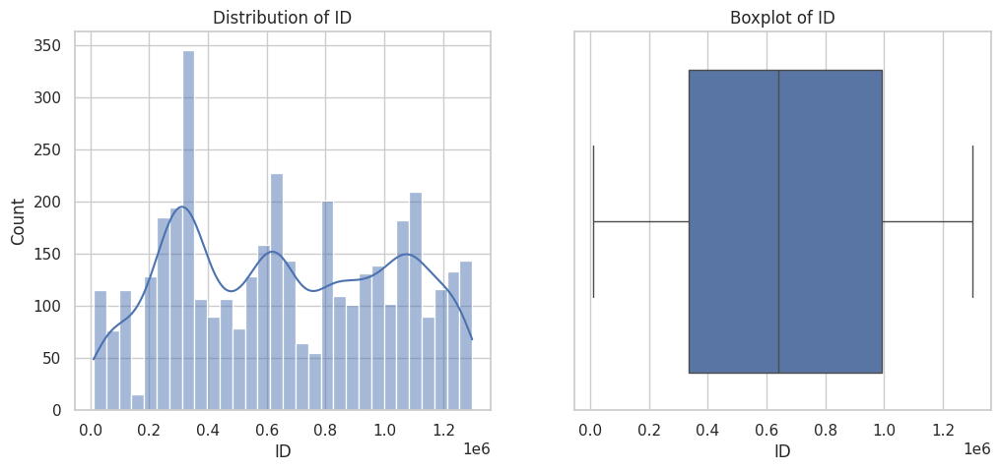

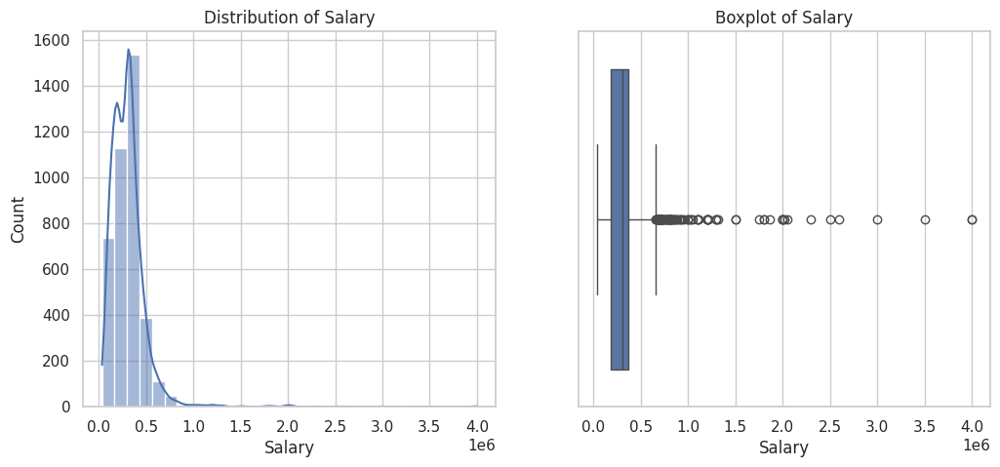

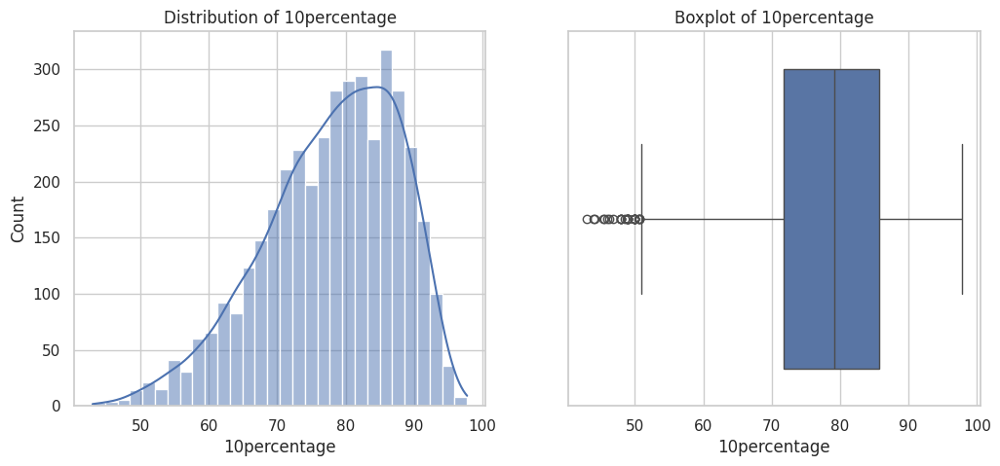

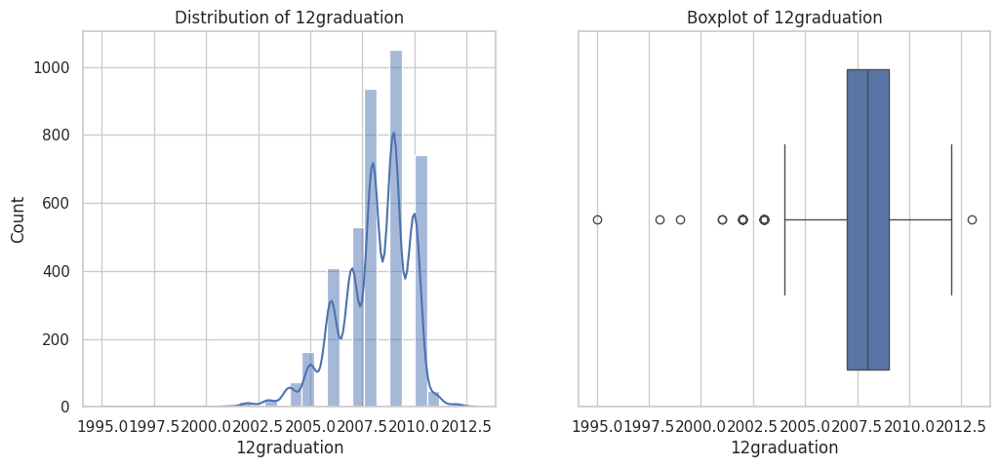

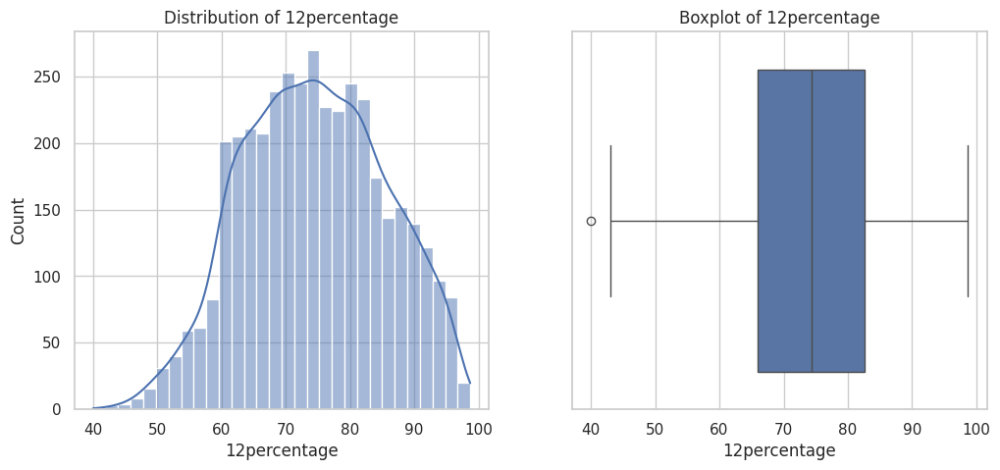

...

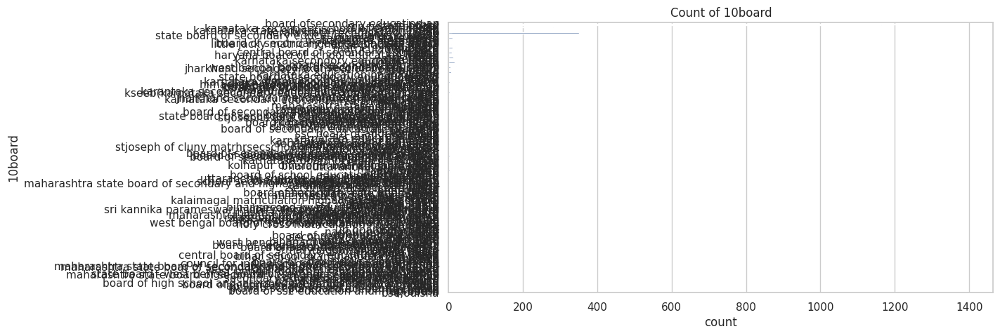

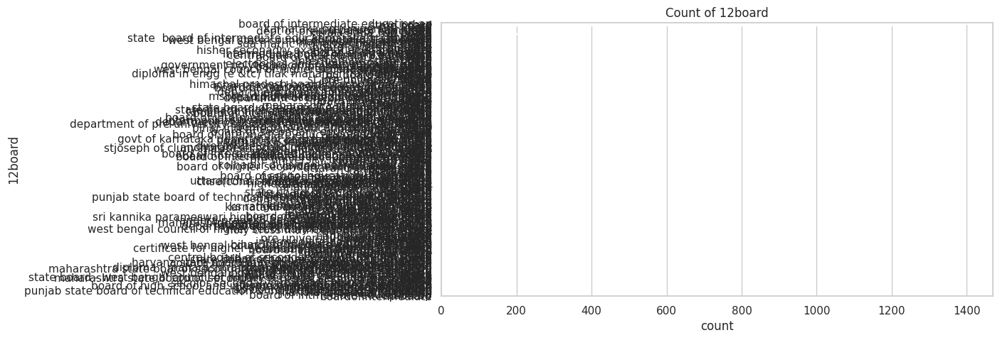

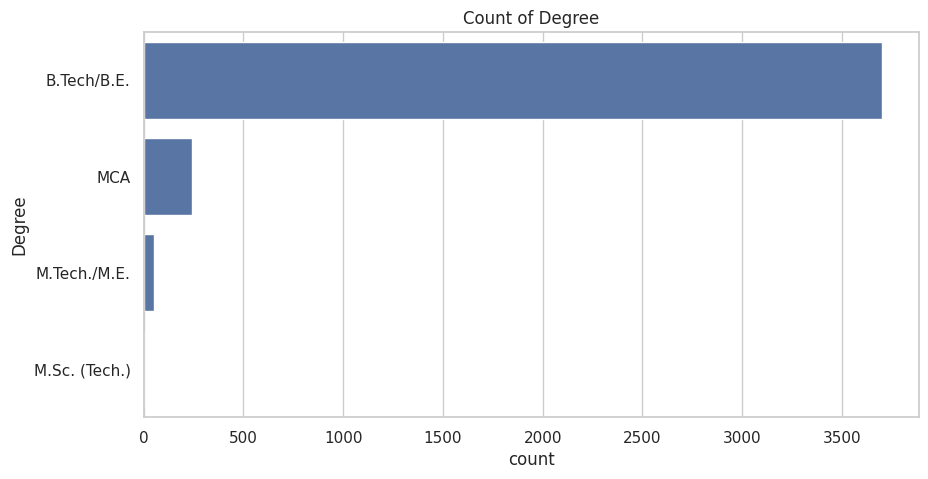

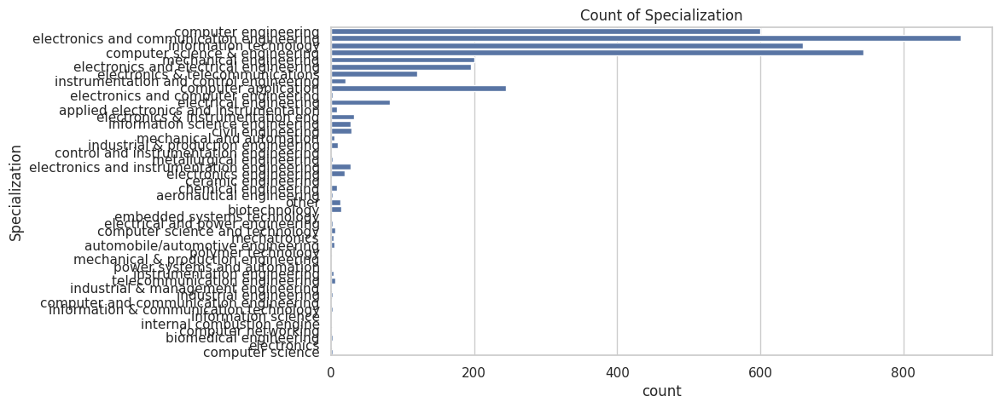

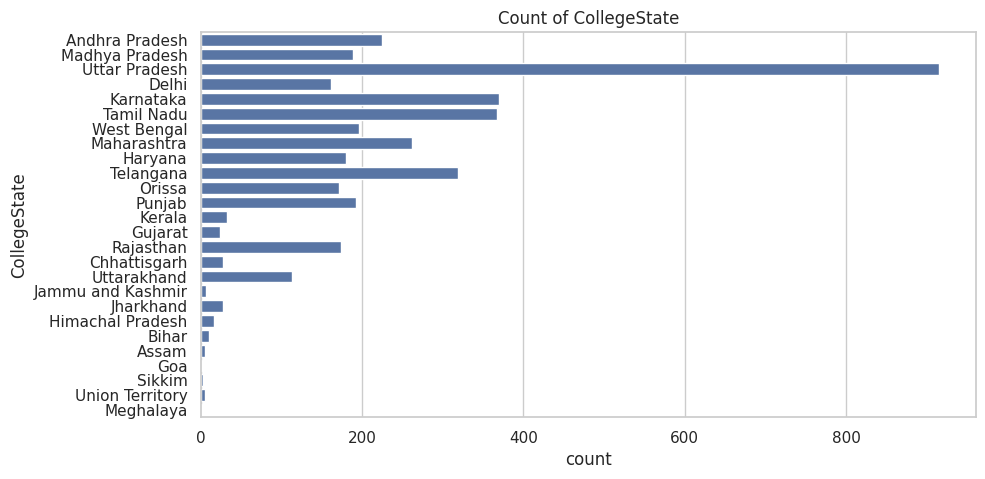

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='whitegrid')
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
for col in numerical_cols:
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    sns.histplot(df[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[col])
    plt.title(f'Boxplot of {col}')
    plt.show()
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    plt.figure(figsize=(10, 5))
    sns.countplot(y=df[col])
    plt.title(f'Count of {col}')
    plt.show()


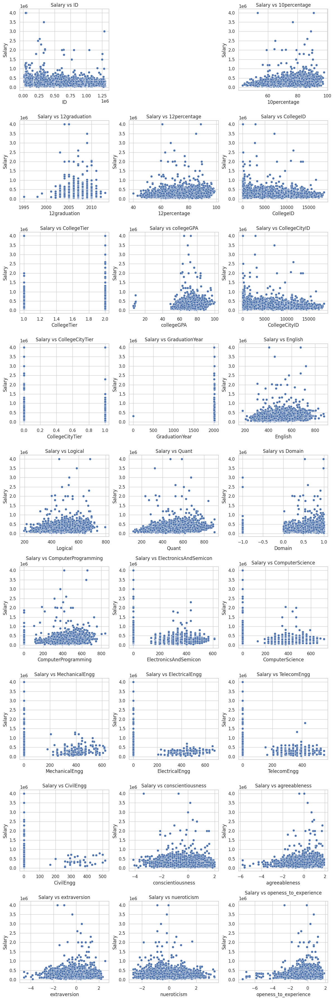

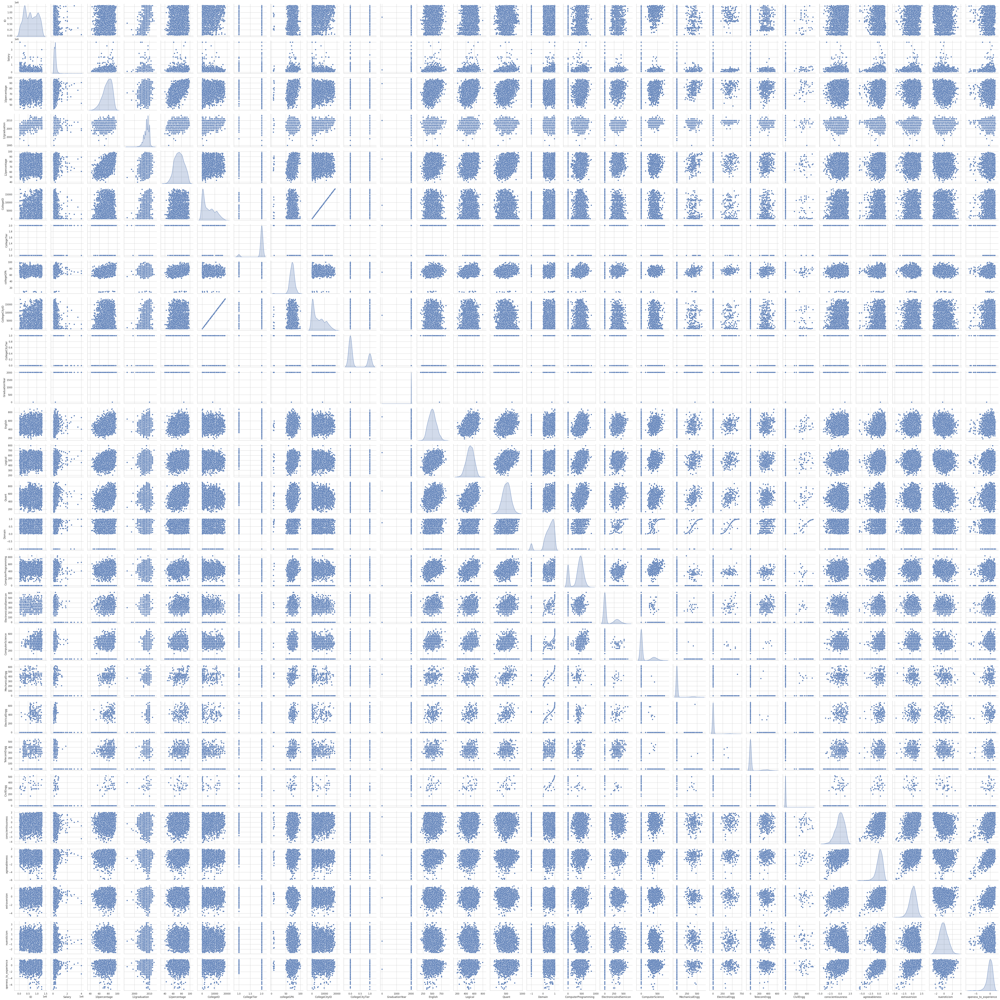

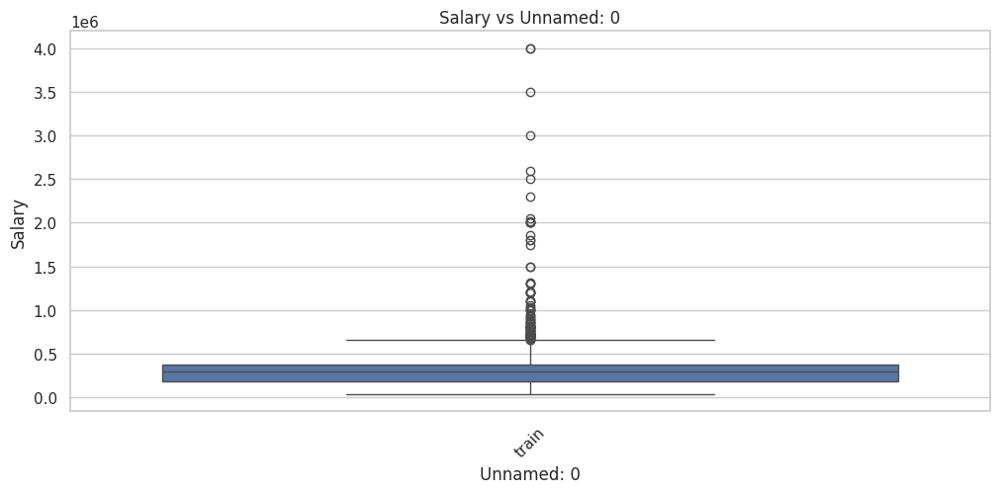

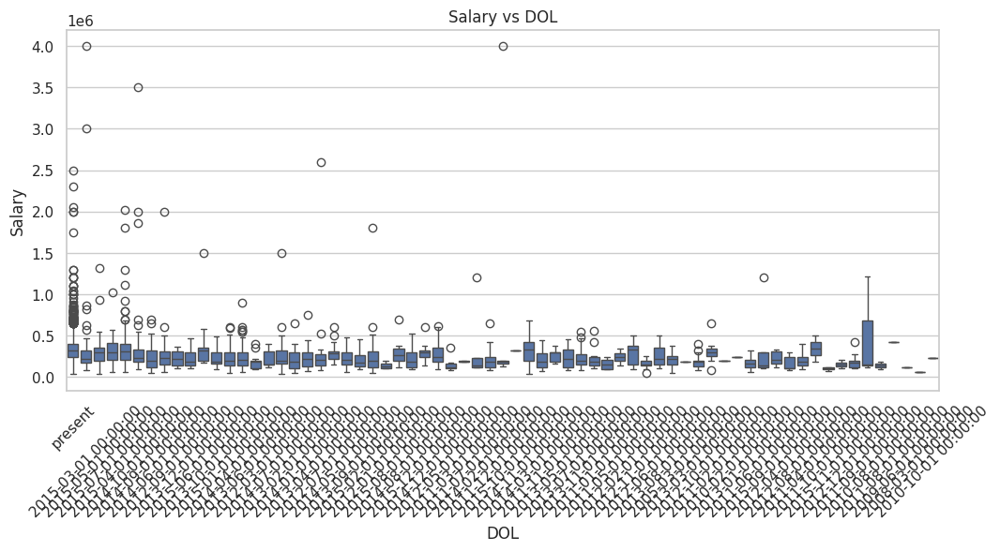

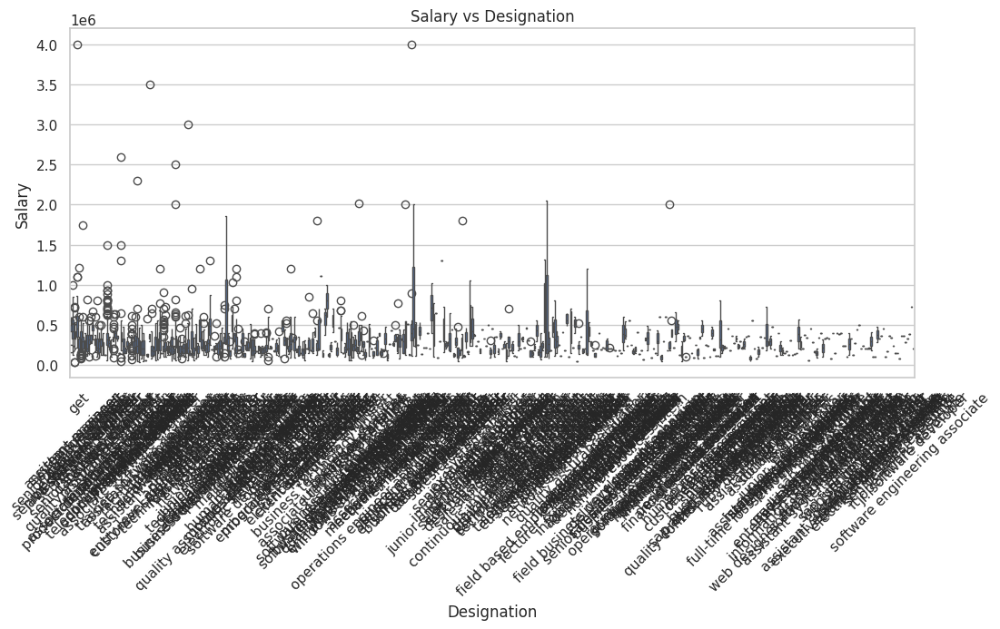

...

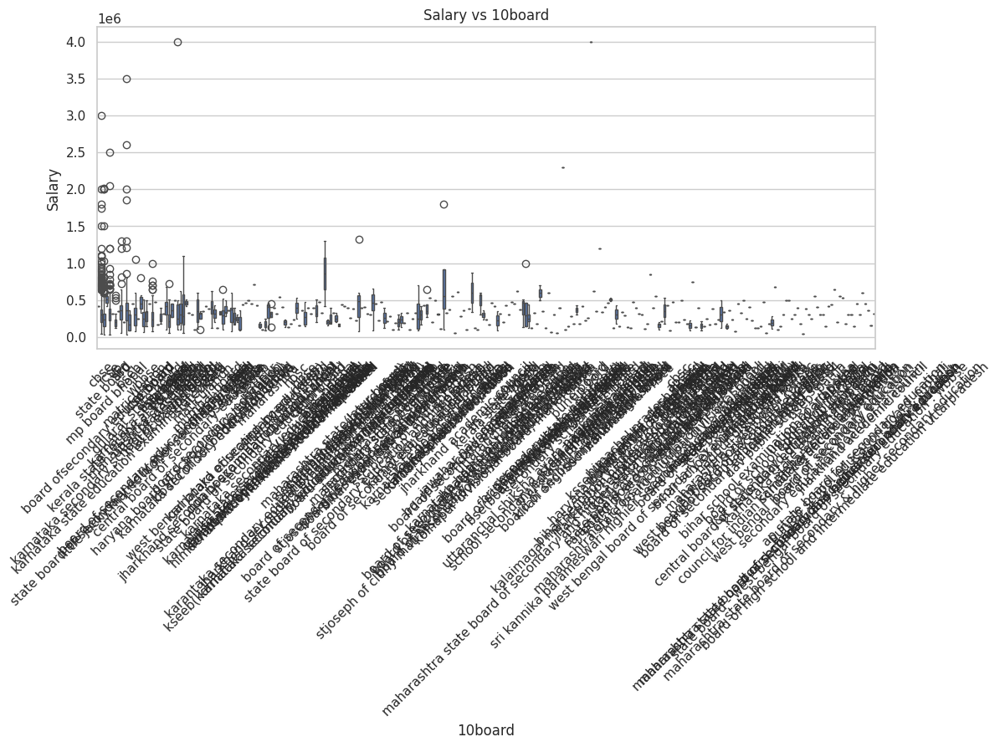

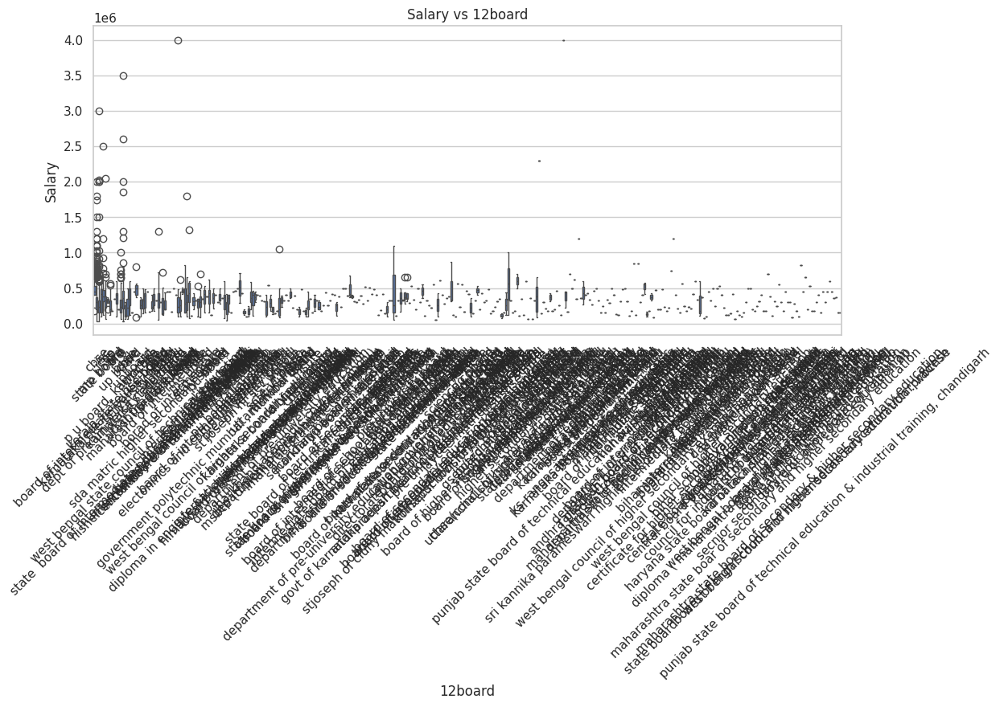

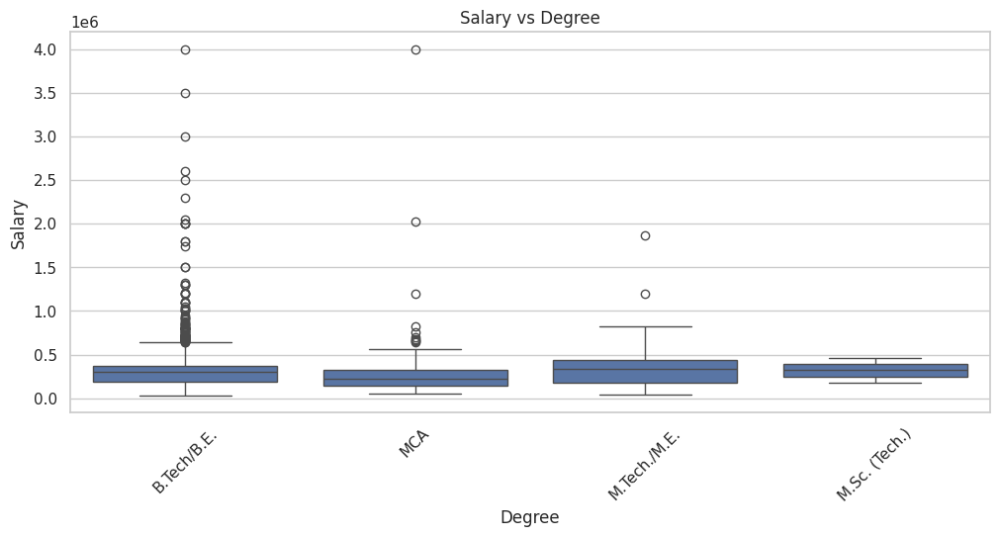

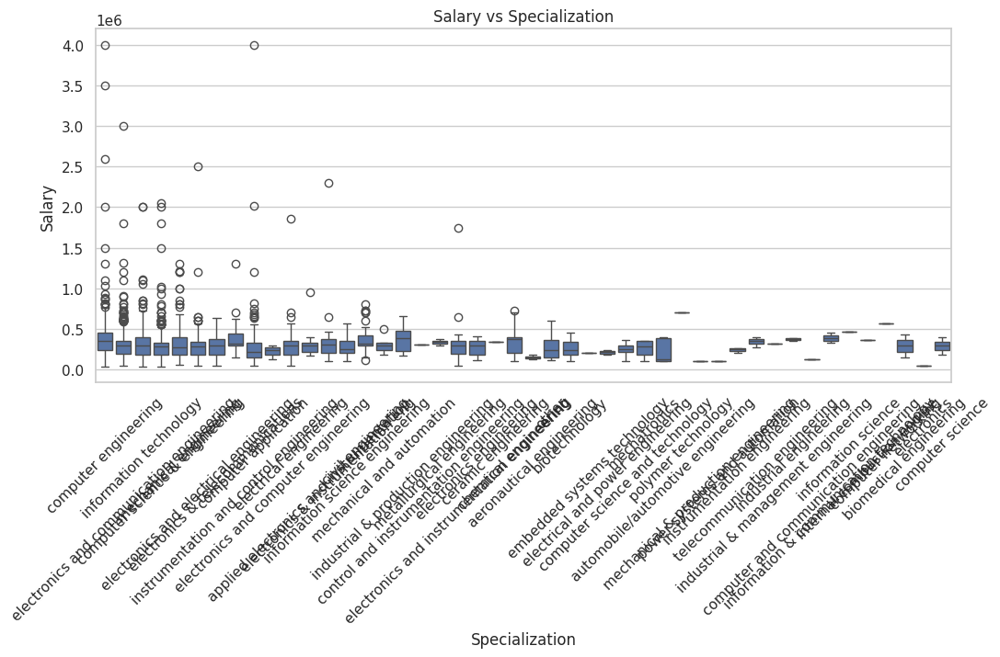

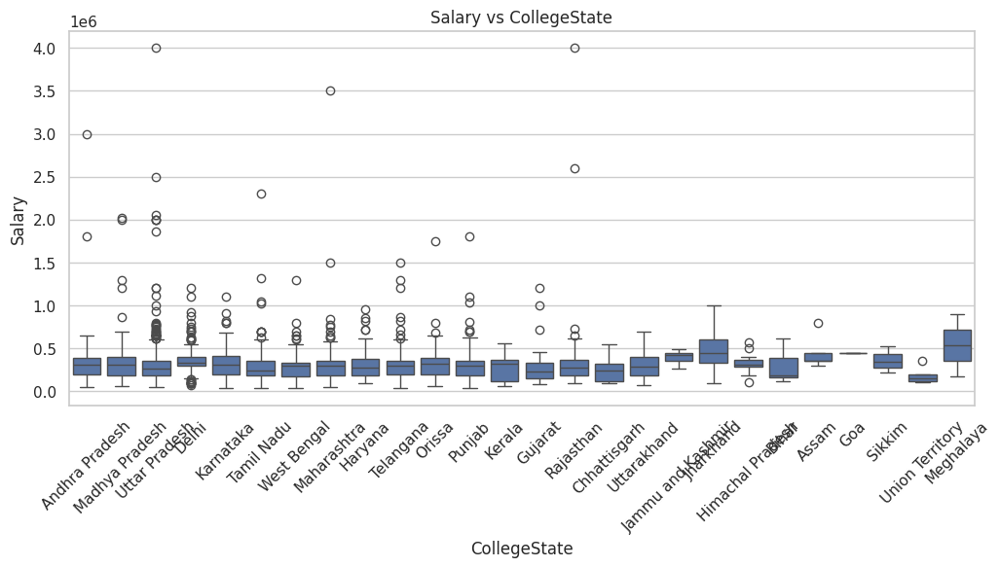

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
num_plots = len(numerical_cols) - 1
num_cols = 3
num_rows = (num_plots // num_cols) + (num_plots % num_cols > 0)
plt.figure(figsize=(12, 4 * num_rows))
for i, col in enumerate(numerical_cols):
    if col != 'Salary':
        plt.subplot(num_rows, num_cols, i + 1)
        sns.scatterplot(x=df[col], y=df['Salary'])
        plt.title(f'Salary vs {col}')
plt.tight_layout()
plt.show()
sns.pairplot(df[numerical_cols], diag_kind='kde')
plt.show()
for col in categorical_cols:
    plt.figure(figsize=(12, 5))
    sns.boxplot(x=df[col], y=df['Salary'])
    plt.title(f'Salary vs {col}')
    plt.xticks(rotation=45)
    plt.show()


In [9]:
missing_values = df.isnull().sum()
print("Missing values in each column:\n", missing_values[missing_values > 0])
for col in numerical_cols:
    if df[col].isnull().any():
        df[col].fillna(df[col].mean(), inplace=True)
for col in categorical_cols:
    if df[col].isnull().any():
        df[col].fillna(df[col].mode()[0], inplace=True)
df_encoded = pd.get_dummies(df, columns=categorical_cols, drop_first=True)
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_numerical_cols = scaler.fit_transform(df_encoded[numerical_cols])
df_encoded[numerical_cols] = scaled_numerical_cols

print("Data preprocessing completed. Sample of the processed data:")
print(df_encoded.head())


Missing values in each column:
 Series([], dtype: int64)
Data preprocessing completed. Sample of the processed data:
         ID    Salary        DOJ        DOB  10percentage  12graduation  \
0 -1.268535  0.527947 2012-06-01 1990-02-19      0.647233     -0.657765   
1 -0.230991  0.904045 2013-09-01 1989-10-04      0.758921     -0.657765   
2  0.404233  0.081332 2014-06-01 1992-08-03      0.718307      1.156686   
3 -1.091347  3.724775 2011-07-01 1989-12-05      0.779227     -0.657765   
4 -0.881871 -0.506320 2014-03-01 1991-02-27      0.007570     -0.052948   

   12percentage  CollegeID  CollegeTier  collegeGPA  ...  CollegeState_Orissa  \
0      1.939676  -0.836346     0.283282    0.797646  ...                False   
1      0.957729   0.135401     0.283282   -0.174641  ...                False   
2     -0.569744  -1.060644     0.283282   -0.181988  ...                False   
3      0.830439   0.367196    -3.530054    0.386200  ...                False   
4      0.212176   1.293542 

In [10]:
from sklearn.model_selection import train_test_split
X = df_encoded.drop(columns=['Salary'])
y = df_encoded['Salary']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("Training set shape:", X_train.shape)
print("Testing set shape:", X_test.shape)


Training set shape: (3198, 1537)
Testing set shape: (800, 1537)


In [17]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
df = pd.read_excel('/data.xlsx')
datetime_cols = df.select_dtypes(include=['datetime64']).columns.tolist()
for col in datetime_cols:
    df[col] = df[col].astype('int64') // 10**9
categorical_cols = df.select_dtypes(include=['object']).columns.tolist()
df = pd.get_dummies(df, columns=categorical_cols, drop_first=True)
X = df.drop(columns=['Salary'])
y = df['Salary']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = RandomForestRegressor()
model.fit(X_train, y_train)
predictions = model.predict(X_test)
print(predictions[:5])


[520850. 420100. 321800. 232000. 269800.]


Mean Absolute Error (MAE): 89941.3125
Mean Squared Error (MSE): 24027357603.125
R² Score: 0.17374690273905813


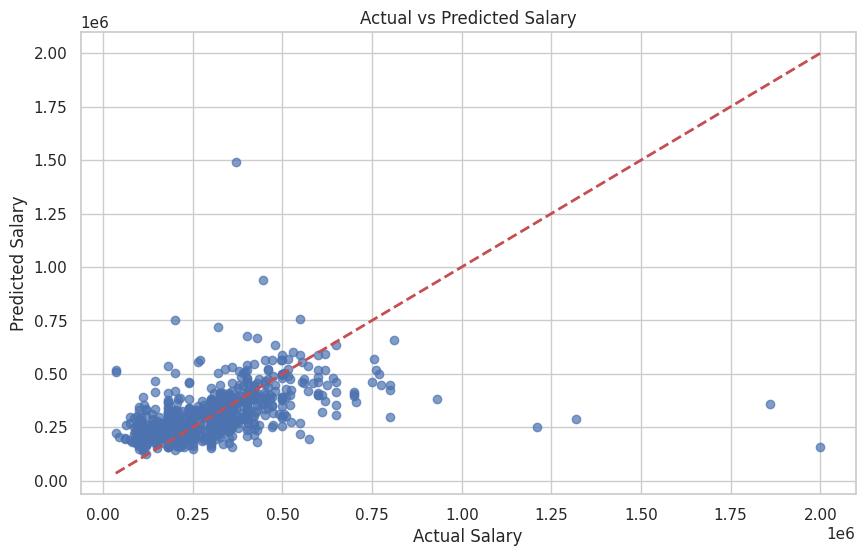

In [18]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f'Mean Absolute Error (MAE): {mae}')
print(f'Mean Squared Error (MSE): {mse}')
print(f'R² Score: {r2}')
plt.figure(figsize=(10, 6))
plt.scatter(y_test, predictions, alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)  # 45-degree line
plt.xlabel('Actual Salary')
plt.ylabel('Predicted Salary')
plt.title('Actual vs Predicted Salary')
plt.show()


In [19]:
!pip install joblib


In [20]:
import joblib
joblib.dump(model, 'salary_prediction_model.joblib')
print("Model saved as 'salary_prediction_model.joblib'")


Model saved as 'salary_prediction_model.joblib'
